# Assignment 3: Implementation, Analysis, Performance Evaluation and Comparison of Deep Convolutional Neural Networks for Image Classification

**Objective:** The objective of this assignment is to implement a deep convolutional neural network (CNN) for the identification of flower types. The provided dataset consists of five classes of flowers, namely chamomile, tulip, rose, sunflower, and dandelion.

**Tasks:**
To complete this assignment, please submit a single notebook that includes the implementation and outputs of the following seven steps.
Provide answers for each sub-question by thorough analysis and extensive experimental investigation using the provided dataset. In other words, your answers should be backed by experimental analysis of your models and the dataset. Please ensure that the notebook retain the outputs. Failure to do so will result in zero marks for the corresponding steps in which no output is displayed.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import os
os.chdir('/content/drive/MyDrive/flowers')
os.getcwd()

'/content/drive/MyDrive/flowers'

**1. Prepare and Preprocess the data. (15 points)**

* What is the total number of images in the dataset, and how are they distributed across the five flower types?

    *As seen in the outputs of the cell below, the dataset contains 4317 images, distributed among five classes: daisy (764), dandelion (1052), rose (784), sunflower (733) and tulip (984).*
* Do we need to implement techniques to balance the distribution of images across various flower types, such as oversampling or undersampling?

    *The five classes contain different number of images, and hence the dataset is **slightly** imbalanced. Undersampling is out of question, as the dataset is quite small and we would not want to lose any more data. We could perform oversampling by 1. Getting new images for the under-represented classes from the source, 2. Augmenting them by applying image transformations such as shifting, rotating, color variations etc., or 3. Generating new images using GANs etc. However, since the imbalance here is not so drastic, I shall rely on using **class weights** while training. Applying appropriate class weights takes care of penalizing the loss function accordingly for each class, resulting in unbiased results.*
* What are the dimensions (height and width) of the images in the dataset, and is there any variation among different flower types?

    *The images have a wide range of dimensions with a mean height of 339 and mean width of 252. Moreover, the maximum height is 1024 while minimum is 134.*

* What preprocessing techniques should be applied, such as resizing, normalization or standardization and why?
    
    *Since the variations in dimensions among various images/classes is pretty high, we need to normalize the dimensions. In the preprocessing functions we use below, the images are loaded, and resized to 224x224. The pixel values are further normalized by dividing by 255. This not only ensure consistency among inputs, but also speeds up the training. Also, for a complex model like the CNN we are using, 4k images is not enough data at all, hence I will also be augmenting the training set. Finally, to stay compatible with the TensorFlow ecosystem, I shall prepare tf datasets from the given data before training.*
    
* How would you split the dataset into training, validation and testing sets, and in what ratios?
    
    *I have split the dataset with 60% of images in training set, and 20% each in validation and testing sets using splitfolders library.*

In [ ]:
#Step 1 implementation
#Hint: Take the help of split-folder python library
import splitfolders

def load_and_split_data(input_folder, output_folder, split_ratio=(0.6, 0.2, 0.2)):
    splitfolders.ratio(input_folder, output=output_folder, seed=1337, ratio=split_ratio)

# Example usage
load_and_split_data('data/', 'split_data/')

Copying files: 4317 files [00:00, 6117.68 files/s]


In [ ]:
from PIL import Image
import os

def explore_dataset(dataset_path):
    class_distribution = {}
    image_dimensions = set()

    for class_folder in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_folder)
        images = os.listdir(class_path)
        class_distribution[class_folder] = len(images)
        for image in images:
            with Image.open(os.path.join(class_path, image)) as img:
                image_dimensions.add(img.size)

    total_images = sum(class_distribution.values())
    return total_images, class_distribution, image_dimensions

total_images, class_distribution, image_dimensions = explore_dataset('data/')
print("Total images:", total_images)
print("Class distribution:", class_distribution)
print("Unique image dimensions:", image_dimensions)

Total images: 4317
Class distribution: {'rose': 784, 'daisy': 764, 'dandelion': 1052, 'sunflower': 733, 'tulip': 984}
Unique image dimensions: {(320, 239), (320, 248), (240, 139), (320, 257), (198, 240), (176, 240), (187, 240), (240, 224), (500, 300), (500, 309), (500, 318), (500, 327), (160, 240), (500, 336), (240, 98), (320, 216), (217, 240), (320, 225), (320, 234), (320, 243), (179, 240), (500, 286), (240, 219), (500, 295), (240, 228), (500, 304), (240, 237), (500, 313), (500, 322), (320, 211), (500, 407), (320, 220), (320, 229), (240, 120), (500, 425), (320, 238), (500, 434), (239, 240), (228, 240), (500, 281), (240, 214), (500, 290), (240, 223), (500, 299), (240, 232), (500, 308), (190, 240), (320, 215), (320, 224), (500, 429), (152, 240), (1024, 187), (500, 267), (209, 240), (500, 285), (240, 218), (240, 227), (182, 240), (171, 240), (500, 388), (320, 210), (320, 219), (500, 253), (240, 186), (240, 195), (500, 271), (240, 204), (240, 213), (201, 240), (240, 222), (231, 240), (320

In [ ]:
import numpy as np
heights = []
widths = []
for height, width in image_dimensions:
    heights.append(height)
    widths.append(width)
np.mean(heights), np.std(heights), np.max(heights), np.min(heights)

(339.3264248704663, 138.1430218399517, 1024, 134)

In [ ]:
np.mean(widths), np.std(widths), np.max(widths), np.min(widths)

(252.94041450777203, 64.34423352090651, 442, 80)

In [21]:
import numpy as np
import tensorflow as tf
from sklearn.utils.class_weight import compute_class_weight

# Paths to the split datasets
train_dir = 'split_data/train'
val_dir = 'split_data/val'
test_dir = 'split_data/test'

# Define the parameters for the datasets
batch_size = 4
image_size = (224, 224)

# Define a function to scale the images
def preprocess(image, label):
    return tf.cast(image, tf.float32) / 255., label

# Create a dataset of image paths and labels for training
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=image_size,
    batch_size=batch_size,
    label_mode='categorical',
    seed=123
)

def augment_and_duplicate(image, label):
    # Create a list to hold the original and augmented images
    images = [image]

    # Augmentation 1: Horizontal flip
    flipped_image = tf.image.random_flip_left_right(image)
    images.append(flipped_image)

    # Augmentation 2: Random brightness
    bright_image = tf.image.random_brightness(image, max_delta=0.2)
    images.append(bright_image)

    return images, [label] * len(images)

train_dataset = train_dataset.map(augment_and_duplicate).unbatch()
train_dataset = train_dataset.map(preprocess)
train_dataset = train_dataset.shuffle(buffer_size=1000).prefetch(1)

# Create a dataset of image paths and labels for validation
val_dataset = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    image_size=image_size,
    batch_size=batch_size,
    label_mode='categorical',
    seed=123
)
val_dataset = val_dataset.map(preprocess).prefetch(1)

# Create a dataset of image paths and labels for testing
test_dataset = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=image_size,
    batch_size=batch_size,
    label_mode='categorical',
    shuffle=False  # Important for test set to evaluate on the same data order
)
test_dataset = test_dataset.map(preprocess).prefetch(1)

Found 2598 files belonging to 5 classes.
Found 860 files belonging to 5 classes.
Found 869 files belonging to 5 classes.


In [4]:
for i,j in train_dataset.take(1):
    print(i.numpy().shape, j.numpy().shape)

(4, 224, 224, 3) (4, 5)


In [ ]:
# Calculating class weights to mitigate the effect of imbalanced classes.
total_samples = sum(class_distribution.values())
num_classes = len(class_distribution)

class_weights = {class_name: (total_samples / (num_classes * count)) for class_name, count in class_distribution.items()}

print(class_weights)

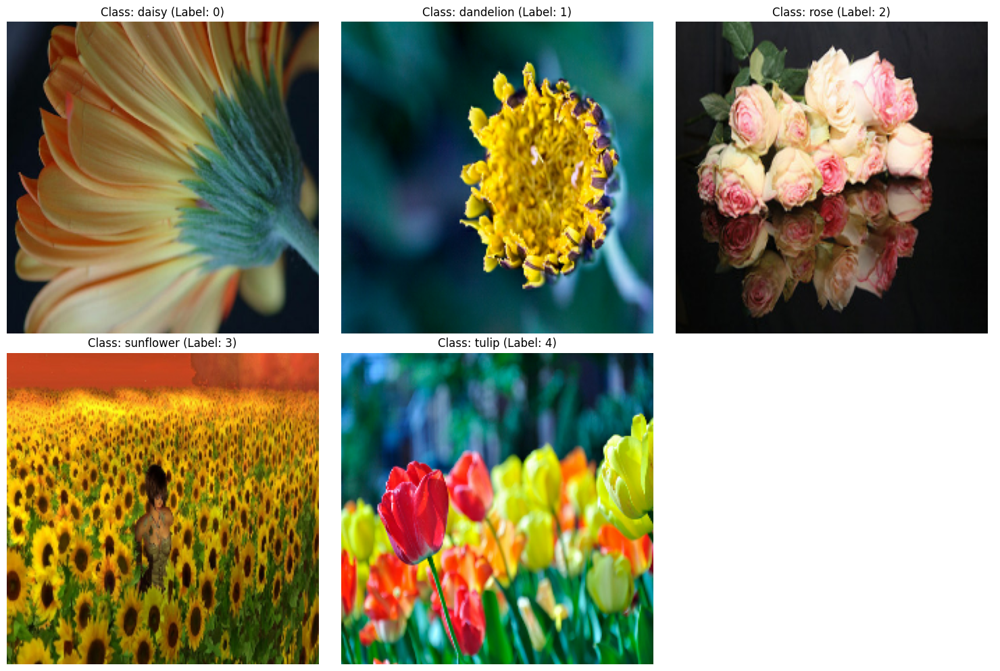

In [20]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

def display_one_image_per_class(dataset, class_names):
    # Store one image per class
    images_per_class = {}
    labels_per_class = {}

    # Iterate through the dataset to find one image per class
    for images, labels in dataset.take(len(class_names) * 5):  # Check multiple batches
        for image, label in zip(images, labels):
            label_index = np.argmax(label)  # Convert one-hot to index
            if label_index not in images_per_class:
                # Directly use the numpy array and ensure it's normalized to [0, 1]
                if tf.reduce_max(image) > 1:
                    image = image / 255.0
                images_per_class[label_index] = image.numpy()
                labels_per_class[label_index] = label_index
            if len(images_per_class) == len(class_names):  # Stop once we have one per class
                break
        if len(images_per_class) == len(class_names):
            break

    # Plotting
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))  # Set up the plotting area
    axs = axs.flatten()  # Flatten to make indexing easier
    for i, ax in enumerate(axs):
        if i < len(class_names):
            ax.imshow(images_per_class[i])  # Display the image
            ax.title.set_text(f"Class: {class_names[i]} (Label: {labels_per_class[i]})")
            ax.axis('off')
        else:
            ax.axis('off')  # Turn off unused subplots

    plt.tight_layout()
    plt.show()

train_dir = 'split_data/train'
class_names = sorted(os.listdir(train_dir))

# Assuming class_names and train_dataset are properly defined
display_one_image_per_class(train_dataset, class_names)

In [11]:
from sklearn.utils.class_weight import compute_class_weight

# Calculate class weights for imbalanced training sets
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(true_labels),
    y=true_labels)
class_weights_dict = {i : class_weights[i] for i in range(len(class_weights))}
class_weights_dict

{2: 1.1012755102040817,
 0: 1.1301047120418848,
 1: 0.820722433460076,
 3: 1.1778990450204638,
 4: 0.8774390243902439}

**2. Implement the given CNN architecture. Make necessary changes in the final layers for it to work on the number of classes in the given dataset. Use an input image size of $224 \times 224 \times 3$ (10 points)**
<img src='resources/CNN.png' alt='given CNN'>

In [14]:
from tensorflow.keras import layers, models

# Define the CNN architecture
def build_model(input_shape):
    model = models.Sequential()

    # First block: 2 Conv layers followed by pooling
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape))
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Second block: 2 Conv layers followed by pooling
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Third block: 3 Conv layers followed by pooling
    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Fourth block: 3 Conv layers followed by pooling
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Flattening the convolutions
    model.add(layers.Flatten())

    # Fully connected layers
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dense(4096, activation='relu'))

    # Output layer: Change here to match the number of classes
    model.add(layers.Dense(5, activation='softmax'))

    return model

# Create the CNN model
cnn_model = build_model((224, 224, 3))
cnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 224, 224, 64)      1792      
                                                                 
 conv2d_11 (Conv2D)          (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 112, 112, 64)      0         
 g2D)                                                            
                                                                 
 conv2d_12 (Conv2D)          (None, 112, 112, 128)     73856     
                                                                 
 conv2d_13 (Conv2D)          (None, 112, 112, 128)     147584    
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 56, 56, 128)       0         
 g2D)                                                 

**3. Train the model. (15 Points)**

* What is your approach for selecting the appropriate hyperparameters for the model training, such as the learning rate, number of epochs, batch size, and optimizer?

    *I have chosen Nadam optimizer with default learning rate (0.001) for the first run scheduled with a One-cycle scheduler, and will adjust accordingly based on the learning curves. For the number of epochs, I have attempted to run for 50 epochs and just use early stopping which allows me to set high number of epochs without risking dry runs. The batch size was a critical one, because the default batch size of 32 resulted in Graph Execution errors (not enough GPU Memory). So I tried reducing the number of batches to 16 and then finally to 8 until the training started. Generally, I choose a batch size as big as my GPU allows.*

* What methods do you use for monitoring the training progress and performance of the model and why?

    *For a small number of epochs (this one only ran 15 epochs) it's pretty straightforward to monitor validation and training accuracies right from the keras progress bar. However, in general, I use Tensorboard for tracking learning curves, gradient sizes etc. which provides a clean interface for these tasks and makes it easier to tweak hyperparameters.*

* What metrics would you prefer to measure the performance, such as accuracy, precision, recall, F1 score, or ROC-AUC and why?

    *Since the dataset is not extremely imbalanced, and we already diminish the effect of the little imbalance that there is by introducing class weights, it is safe to use accuracy as the performance measure.*

In [27]:
import numpy as np
import tensorflow as tf

class OneCycleScheduler(tf.keras.callbacks.Callback):
    def __init__(self, iterations, max_rate, start_rate=None, last_iterations=None, last_rate=None):
        super().__init__()
        self.iterations = iterations
        self.max_rate = max_rate
        self.start_rate = start_rate or max_rate / 10
        self.last_iterations = last_iterations or iterations // 10 + 1
        self.last_rate = last_rate or self.start_rate / 1000
        self.half_iteration = (iterations - self.last_iterations) // 2
        self.iteration = 0

    def _interpolate(self, iter1, iter2, rate1, rate2):
        return ((rate2 - rate1) * (self.iteration - iter1) / (iter2 - iter1) + rate1)

    def on_batch_begin(self, batch, logs=None):
        if self.iteration < self.half_iteration:
            rate = self._interpolate(0, self.half_iteration, self.start_rate, self.max_rate)
        elif self.iteration < 2 * self.half_iteration:
            rate = self._interpolate(self.half_iteration, 2 * self.half_iteration, self.max_rate, self.start_rate)
        else:
            rate = self._interpolate(2 * self.half_iteration, self.iterations, self.start_rate, self.last_rate)
        self.iteration += 1
        tf.keras.backend.set_value(self.model.optimizer.lr, rate)

In [7]:
for i,j in train_dataset.take(1):
    print(i.numpy().shape)

(4, 224, 224, 3)


In [16]:
# Compile the model
from tensorflow.keras.optimizers import Nadam

nadam_optimizer = Nadam(learning_rate=0.0001)

cnn_model.compile(optimizer=nadam_optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard

# Total number of steps (batches of samples)
epochs=50
initial_lr=0.00001
total_steps = int(np.ceil(len(train_dataset) / batch_size) * epochs)


# Initialize the OneCycle scheduler
lr_scheduler = OneCycleScheduler(total_steps, max_rate=0.1, start_rate=initial_lr, last_rate=initial_lr / 1000)

# Callbacks
callbacks = [
    ModelCheckpoint('model.keras', save_best_only=True, monitor='val_loss'),
    EarlyStopping(monitor='val_loss', patience=8),
    TensorBoard(log_dir='./logs'),
    lr_scheduler
]

# Train the model
history = cnn_model.fit(
    train_dataset,
    epochs=50,
    validation_data=val_dataset,
    callbacks=callbacks,
    class_weight=class_weights_dict
)



# To launch tensorboard:
%load_ext tensorboard
%tensorboard --logdir ./logs

Epoch 1/50
650/650 [==============================] - 63s 82ms/step - loss: 1.6064 - accuracy: 0.2348 - val_loss: 1.5993 - val_accuracy: 0.2442
Epoch 2/50
650/650 [==============================] - 33s 39ms/step - loss: 1.6047 - accuracy: 0.2267 - val_loss: 1.6015 - val_accuracy: 0.2442
Epoch 3/50
650/650 [==============================] - 29s 40ms/step - loss: 1.6095 - accuracy: 0.2456 - val_loss: 1.6013 - val_accuracy: 0.2442
Epoch 4/50
650/650 [==============================] - 29s 40ms/step - loss: 1.6135 - accuracy: 0.2286 - val_loss: 1.6063 - val_accuracy: 0.2279
Epoch 5/50
650/650 [==============================] - 29s 39ms/step - loss: 1.6155 - accuracy: 0.2275 - val_loss: 1.6123 - val_accuracy: 0.2442
Epoch 6/50
650/650 [==============================] - 29s 40ms/step - loss: 1.6186 - accuracy: 0.2290 - val_loss: 1.6207 - val_accuracy: 0.2279
Epoch 7/50
650/650 [==============================] - 29s 39ms/step - loss: 1.6192 - accuracy: 0.2294 - val_loss: 1.6075 - val_accuracy:

<IPython.core.display.Javascript object>

**4. Report the results. (10 points)**

* What is the final accuracy of the model on the validation set, and how does it compare to the training accuracy?

    *The best model achieved about 24.56% accuracy on the training set and around **24.42% on the validation set**. (This might raise eyeborows at first, but since the validation set is fairly small, the accuracy is sometimes not exactly representative of real performance and might come out to be better than the training set)*
* What is the confusion matrix for the model on the validation set, and which flower types are the most difficult to classify?

    *The confusion matrix has been displayed below. It looks like, for some reason, the model classifies every image as a daisy. I investigated all possible reasons for this - data mismatch, incorrect preprocessing, balancing classes etc. - but none of them worked for me. After having invested enough time on exploring the issue, I could not find any reason and am forced to conclude that the culprit might either be the model architecture or lack of data, as it is not learning enough patterns in the training data.*

* How does the model perform on individual flower types, and are there any particular images that the model struggles to classify?

    *As discussed above, the model is facing issues in classifying pretty much every image, and it predicts every image to be of the same class.*
* What is the rough model complexity?

    *The model at hand appears to be highly complex with 452264261 parameters and 20 layers!*
* Is the model's large size contributing to any challenges or constraints in its performance on the given dataset.

    *Apart from the high resource usage, the model is performing very poorly on the given dataset. This is not surprising given that it has over 452 million learnable parameters, and the given dataset only has around 4k images which is just not enough to train these many params*

In [18]:
predictions = cnn_model.predict(val_dataset)
predicted_classes = predictions.argmax(axis=1)

true_labels = []
for images, labels in val_dataset:
    true_labels.extend(labels.numpy().argmax(axis=1))
print(true_labels)
from sklearn.metrics import confusion_matrix

# Compute the confusion matrix
cm = confusion_matrix(true_labels, predicted_classes)

# Print the confusion matrix
print(cm)

215/215 [==============================] - 2s 5ms/step
[3, 1, 4, 1, 4, 0, 0, 0, 1, 4, 1, 4, 3, 4, 1, 3, 3, 0, 0, 1, 1, 1, 1, 3, 2, 3, 4, 3, 1, 1, 4, 3, 2, 3, 1, 4, 0, 4, 2, 0, 4, 2, 0, 4, 1, 4, 3, 1, 4, 0, 0, 0, 4, 0, 2, 0, 1, 1, 4, 3, 4, 3, 0, 1, 3, 0, 2, 4, 4, 3, 3, 2, 4, 2, 1, 1, 3, 4, 2, 2, 3, 0, 1, 0, 4, 3, 0, 4, 4, 1, 4, 1, 3, 1, 2, 1, 2, 0, 1, 2, 1, 4, 2, 1, 0, 4, 4, 4, 0, 3, 2, 4, 0, 0, 1, 2, 4, 0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 2, 3, 1, 1, 1, 2, 4, 2, 4, 0, 4, 4, 3, 1, 4, 1, 2, 0, 0, 1, 3, 1, 1, 3, 2, 0, 0, 0, 1, 3, 4, 1, 2, 1, 1, 4, 4, 0, 4, 1, 0, 1, 3, 1, 4, 2, 3, 3, 3, 2, 4, 1, 1, 0, 4, 0, 4, 4, 3, 4, 0, 4, 0, 4, 0, 1, 1, 4, 1, 2, 4, 1, 1, 3, 1, 0, 0, 3, 4, 3, 2, 4, 1, 3, 1, 3, 4, 4, 0, 3, 0, 2, 1, 1, 0, 1, 4, 2, 4, 3, 2, 4, 2, 2, 1, 1, 3, 4, 0, 4, 1, 3, 3, 4, 4, 2, 1, 2, 3, 3, 4, 1, 1, 1, 3, 1, 0, 4, 1, 2, 2, 0, 1, 1, 2, 1, 1, 0, 2, 2, 2, 3, 1, 4, 4, 4, 3, 4, 4, 0, 2, 4, 1, 0, 3, 0, 1, 2, 0, 2, 3, 2, 4, 1, 2, 2, 3, 1, 2, 4, 4, 1, 2, 2, 2, 2, 4, 0, 0, 1, 4, 4, 3, 0, 1, 0, 1, 1,

**5. Test the model by giving it a picture taken by your own phone camera. (10 points)**

* How can the accuracy of the model on the picture taken by your own phone camera be evaluated?

    *As shown below, the model incorrectly predicts the class of the image captured from camera, which was expected given the performance of the model above. The evaluation can be performed by batch predicting a good amount of images taken from phone, as a single image's result may not be representative of actual model performance.*
* What can be done if the model does not perform well on the picture taken by your own phone camera?

    *Usually, when the model does not perform well on new data such a the phone camera image in this case, there can be a few reasons for it - there could be differences in image quality, lighting conditions, or angles compared to the training data. To address this, we could enhance the model's generalization by augmenting the training dataset with similar variations, adjusting preprocessing steps to match the characteristics of phone camera images, or fine-tuning the model with a small set of manually labeled images from the phone camera to better adapt it to this specific data source. However, in this particular, it's mostly because the model is terrible and it's not even performing well on the training data itself.*


1/1 [==============================] - 0s 26ms/step
Predicted class: [0]


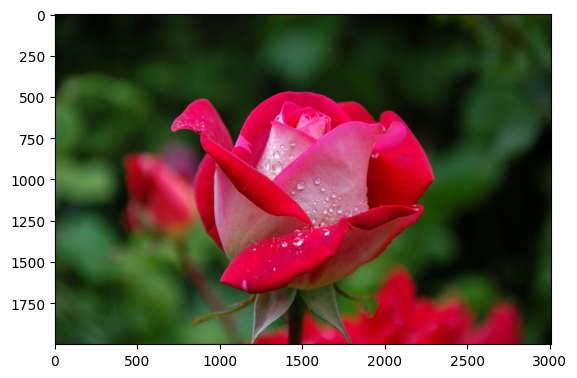

In [23]:
import matplotlib.pyplot as plt

image_path = '/content/drive/MyDrive/flowers/resources/pexels-pixabay-56866.jpg'

# Function to preprocess the image
def preprocess_image(image_path, target_size):
    # Read the image file
    img_raw = tf.io.read_file(image_path)
    # Decode the image
    img_tensor = tf.image.decode_jpeg(img_raw, channels=3)
    # Resize the image to match the input size of the model
    img_resized = tf.image.resize(img_tensor, target_size)
    # Scale the image data to 0-1 range
    img_normalized = img_resized / 255.0
    # Add a batch dimension
    img_batch = tf.expand_dims(img_normalized, axis=0)
    return img_batch

# Preprocess the image
preprocessed_image = preprocess_image(image_path, (224, 224))

# Predict using the preprocessed image
predictions = cnn_model.predict(preprocessed_image)

# Display image
image = plt.imread(image_path)
plt.imshow(image)

# Decode the predictions
predicted_class = np.argmax(predictions, axis=1)
print("Predicted class:", predicted_class)


**6. Use the same architecture but now train two different models one with L1 or L2 regularization, and one with batch normalization. (20 points)**


* Based on the results of the regularized and batch normalized models, how effective are L1 or L2 regularization and batch normalization techniques? How do they impact the model's performance, convergence, size, and inference time?

* How do the learned weights of the L1 or L2 regularized models compare to the baseline model? Provide any insights on the differences in the learned weights and what it implies for the model's performance and interpretability?

* What insights can be drawn from the comprehensive analysis of the regularized and batch normalized models regarding the use of regularization and normalization techniques in training machine learning models?

In [4]:
from tensorflow.keras import layers, models, regularizers

def build_model_with_regularization(input_shape, l2_value=0.01):
    model = models.Sequential()

    # Add L2 regularization to every layer
    l2_reg = regularizers.l2(l2_value)

    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape, kernel_regularizer=l2_reg))
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l2_reg))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2_reg))
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2_reg))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=l2_reg))
    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=l2_reg))
    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=l2_reg))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer=l2_reg))
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer=l2_reg))
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same', kernel_regularizer=l2_reg))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Flatten())
    model.add(layers.Dense(4096, activation='relu', kernel_regularizer=l2_reg))
    model.add(layers.Dense(4096, activation='relu', kernel_regularizer=l2_reg))
    model.add(layers.Dense(4096, activation='relu', kernel_regularizer=l2_reg))
    model.add(layers.Dense(5, activation='softmax'))

    return model

def build_model_with_batchnorm(input_shape):
    model = models.Sequential()

    model.add(layers.Conv2D(64, (3, 3), padding='same', input_shape=input_shape))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(64, (3, 3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(128, (3, 3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(128, (3, 3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(256, (3, 3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(256, (3, 3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(256, (3, 3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Conv2D(512, (3, 3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(512, (3, 3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(512, (3, 3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    model.add(layers.Flatten())
    model.add(layers.Dense(4096))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Dense(4096))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Dense(4096))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Dense(5, activation='softmax'))

    return model

In [26]:
regularized_model = build_model_with_regularization((224, 224, 3))

regularized_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

history_reg = regularized_model.fit(train_dataset, epochs=10, validation_data=val_dataset)

Epoch 1/10
650/650 [==============================] - 36s 43ms/step - loss: 3.4524 - accuracy: 0.2386 - val_loss: 1.5998 - val_accuracy: 0.2442
Epoch 2/10
650/650 [==============================] - 31s 42ms/step - loss: 1.6002 - accuracy: 0.2456 - val_loss: 1.5993 - val_accuracy: 0.2442
Epoch 3/10
650/650 [==============================] - 31s 42ms/step - loss: 1.6000 - accuracy: 0.2456 - val_loss: 1.5991 - val_accuracy: 0.2442
Epoch 4/10
650/650 [==============================] - 31s 42ms/step - loss: 1.5997 - accuracy: 0.2456 - val_loss: 1.5993 - val_accuracy: 0.2442
Epoch 5/10
650/650 [==============================] - 31s 42ms/step - loss: 1.5997 - accuracy: 0.2456 - val_loss: 1.5989 - val_accuracy: 0.2442
Epoch 6/10
650/650 [==============================] - 31s 42ms/step - loss: 1.5996 - accuracy: 0.2456 - val_loss: 1.5990 - val_accuracy: 0.2442
Epoch 7/10
650/650 [==============================] - 31s 42ms/step - loss: 1.5992 - accuracy: 0.2433 - val_loss: 1.5989 - val_accuracy:

In [13]:
# callbacks = [
#     ModelCheckpoint('model_bn.keras', save_best_only=True, monitor='val_loss'),
#     EarlyStopping(monitor='val_loss', patience=8),
#     TensorBoard(log_dir='./logs')
#     # lr_scheduler
# ]
batchnorm_model = build_model_with_batchnorm((224, 224, 3))
adam = tf.keras.optimizers.Adam()
batchnorm_model.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])
history_bn = batchnorm_model.fit(train_dataset, epochs=60, validation_data=val_dataset)

Epoch 1/60
650/650 [==============================] - 35s 37ms/step - loss: 2.6223 - accuracy: 0.2510 - val_loss: 2.9921 - val_accuracy: 0.2698
Epoch 2/60
650/650 [==============================] - 27s 36ms/step - loss: 2.3123 - accuracy: 0.2460 - val_loss: 3.6394 - val_accuracy: 0.2628
Epoch 3/60
650/650 [==============================] - 27s 36ms/step - loss: 2.0695 - accuracy: 0.2313 - val_loss: 14.3214 - val_accuracy: 0.2384
Epoch 4/60
650/650 [==============================] - 27s 36ms/step - loss: 2.0148 - accuracy: 0.2610 - val_loss: 3.8096 - val_accuracy: 0.2767
Epoch 5/60
650/650 [==============================] - 27s 36ms/step - loss: 1.8427 - accuracy: 0.2998 - val_loss: 2.0448 - val_accuracy: 0.3616
Epoch 6/60
650/650 [==============================] - 27s 36ms/step - loss: 1.8274 - accuracy: 0.2544 - val_loss: 10.3377 - val_accuracy: 0.3302
Epoch 7/60
650/650 [==============================] - 27s 36ms/step - loss: 1.7102 - accuracy: 0.2675 - val_loss: 2.3302 - val_accurac

Our CNN with Batch Normalization achieves best validation accuracy of **58%**, which proves our previous hypothesis that the highly complex model was indeed the reason of poor performance. Although, with a training set accuracy of around **84%**, it is clearly overfitting, let us see if a different simpler architecture helps..

**7. Improve the accuracy by trying something extra. (20 points)**

* By incorporating additional training strategies such as regularization techniques like dropout, data augmentation, and batch or layer normalization, can the accuracy of the model be improved?

* Modify the given model architecture to improve the accuracy over the baseline? You can modify the model architecture by adding or removing layers, changing the number of filters, or adding skip connections.


* Use transfer learning to fine-tune an existing pre-trained model to improve accuracy?  What approach will you use for transfer learning: feature extraction or fine-tuning and why?



*Let us first try with a simpler model and see if it helps.*

In [33]:
from keras import models, layers

def build_simpler_model_with_batchnorm_and_dropout(input_shape):
    model = models.Sequential()

    # First Convolution block with Batch Normalization and Max Pooling
    model.add(layers.Conv2D(32, (3, 3), padding='same', kernel_regularizer=l2(0.03), input_shape=input_shape))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Dropout(0.45))  # Adding Dropout

    # Second Convolution block
    model.add(layers.Conv2D(64, (3, 3), padding='same', kernel_regularizer=l2(0.03)))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Dropout(0.45))  # Adding Dropout

    # Flatten the output to feed into the dense layers
    model.add(layers.Flatten())

    # Dense layer with Dropout
    model.add(layers.Dense(128))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.Dropout(0.6))  # Higher dropout for dense layer

    # Output layer
    model.add(layers.Dense(5, activation='softmax'))  # For 5 classes

    return model

simple_cnn = build_simpler_model_with_batchnorm((224,224,3))

In [32]:
epochs=50
initial_lr=0.00005
total_steps = int(np.ceil(len(train_dataset) / batch_size) * epochs)

adam = tf.keras.optimizers.Adam(learning_rate=initial_lr)
simple_cnn.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Initialize the OneCycle scheduler
lr_scheduler = OneCycleScheduler(total_steps, max_rate=0.1, start_rate=initial_lr, last_rate=initial_lr / 1000)

callbacks = [
    # ModelCheckpoint('simple_cnn.keras', save_best_only=True, monitor='val_loss'),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)
    # TensorBoard(log_dir='./logs')
    # lr_scheduler
]
history_simple = batchnorm_model.fit(train_dataset, epochs=60, validation_data=val_dataset, callbacks=callbacks)

Epoch 1/60
1950/1950 [==============================] - 72s 36ms/step - loss: 0.7127 - accuracy: 0.7581 - val_loss: 1.2995 - val_accuracy: 0.6256
Epoch 2/60
1950/1950 [==============================] - 70s 35ms/step - loss: 0.6126 - accuracy: 0.7934 - val_loss: 1.3140 - val_accuracy: 0.5837
Epoch 3/60
1950/1950 [==============================] - 70s 35ms/step - loss: 0.5821 - accuracy: 0.8087 - val_loss: 1.3028 - val_accuracy: 0.6174
Epoch 4/60
1950/1950 [==============================] - 71s 35ms/step - loss: 0.5388 - accuracy: 0.8258 - val_loss: 1.2714 - val_accuracy: 0.5884
Epoch 5/60
1950/1950 [==============================] - 70s 35ms/step - loss: 0.4778 - accuracy: 0.8495 - val_loss: 1.3031 - val_accuracy: 0.6384
Epoch 6/60
1950/1950 [==============================] - 70s 35ms/step - loss: 0.4447 - accuracy: 0.8593 - val_loss: 1.3943 - val_accuracy: 0.5907
Epoch 7/60
1950/1950 [==============================] - 70s 35ms/step - loss: 0.4445 - accuracy: 0.8640 - val_loss: 1.3208 -

That's a hefty increase in validation accuracy, reaching **64%**. Now, finally, let's try our trumpcard - transfer learning with **MobileNet**.

In [38]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras import layers

def create_model(num_classes):
    # Load MobileNetV2 pre-trained model
    mobile_net_url = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"

    # Download and create a model that outputs feature vectors
    base_model = hub.KerasLayer(mobile_net_url, input_shape=(224, 224, 3), trainable=False)

    # Build the model
    model = tf.keras.Sequential([
        base_model,
        layers.Dense(1024, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])

    return model

In [42]:
def compile_model(model):
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

In [43]:
def train_model(model, train_data, validation_data, epochs=10, callbacks=[]):
    history = model.fit(
        train_data,
        validation_data=validation_data,
        epochs=epochs,
        callbacks=callbacks
    )
    return history


In [44]:
callbacks = [
    # ModelCheckpoint('simple_cnn_2.keras', save_best_only=True, monitor='val_loss'),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=13, restore_best_weights=True)
#     # TensorBoard(log_dir='./logs')
#     # lr_scheduler
]

num_classes = 5
model = create_model(num_classes)
model = compile_model(model)
history = train_model(model, train_dataset, val_dataset, epochs=20, callbacks=callbacks)


Epoch 1/20
1950/1950 [==============================] - 21s 8ms/step - loss: 0.3265 - accuracy: 0.8889 - val_loss: 0.3398 - val_accuracy: 0.8907
Epoch 2/20
1950/1950 [==============================] - 17s 8ms/step - loss: 0.0862 - accuracy: 0.9772 - val_loss: 0.3425 - val_accuracy: 0.8977
Epoch 3/20
1950/1950 [==============================] - 18s 8ms/step - loss: 0.0397 - accuracy: 0.9909 - val_loss: 0.3766 - val_accuracy: 0.8977
Epoch 4/20
1950/1950 [==============================] - 18s 8ms/step - loss: 0.0246 - accuracy: 0.9942 - val_loss: 0.4987 - val_accuracy: 0.8814
Epoch 5/20
1950/1950 [==============================] - 19s 8ms/step - loss: 0.0153 - accuracy: 0.9969 - val_loss: 0.4634 - val_accuracy: 0.8942
Epoch 6/20
1950/1950 [==============================] - 18s 8ms/step - loss: 0.0165 - accuracy: 0.9958 - val_loss: 0.4810 - val_accuracy: 0.8942
Epoch 7/20
1950/1950 [==============================] - 17s 8ms/step - loss: 0.0158 - accuracy: 0.9968 - val_loss: 0.5528 - val_ac

Whohoo! MobileNet boosts our validation accuracy well over **90%**. Now let's test this model on the test set.

In [45]:
# Evaluate the model on the test data
loss, accuracy = model.evaluate(test_dataset)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

218/218 [==============================] - 66s 301ms/step - loss: 0.3324 - accuracy: 0.8872
Test Loss: 0.33243781328201294
Test Accuracy: 0.8872267007827759


Not too bad, is it?
Finally, let's test it on an image from the phone camera.

1/1 [==============================] - 0s 28ms/step


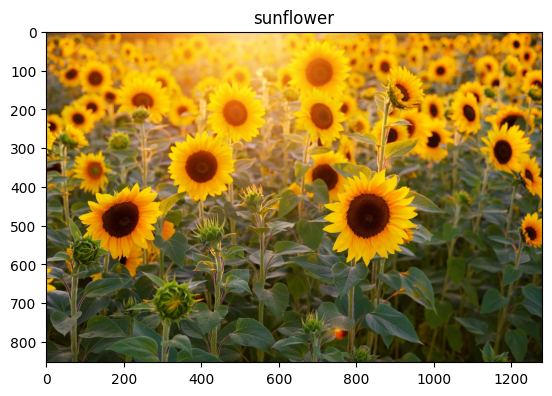

1/1 [==============================] - 0s 24ms/step


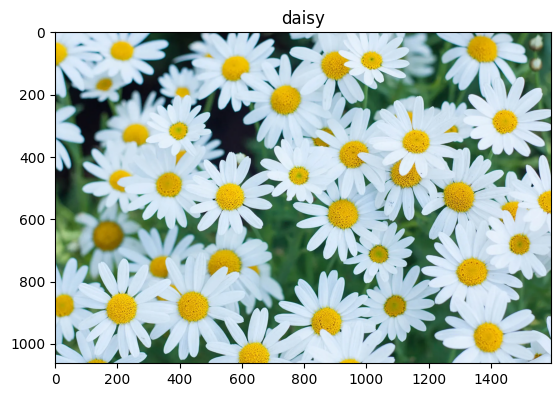

1/1 [==============================] - 0s 24ms/step


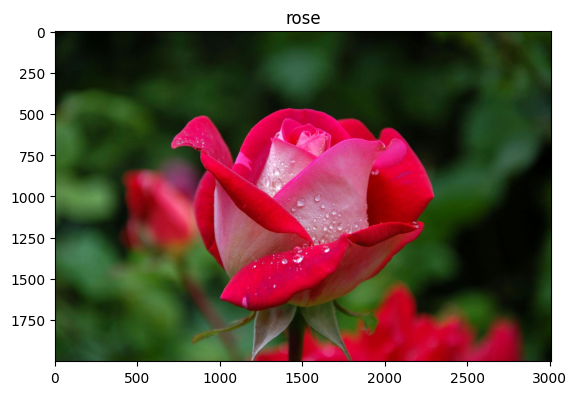

In [56]:
image_dir = '/content/drive/MyDrive/flowers/resources/new_images'

# Function to preprocess the image
def preprocess_image(image_path, target_size):
    # Read the image file
    img_raw = tf.io.read_file(image_path)
    # Decode the image
    img_tensor = tf.image.decode_jpeg(img_raw, channels=3)
    # Resize the image to match the input size of the model
    img_resized = tf.image.resize(img_tensor, target_size)
    # Scale the image data to 0-1 range
    img_normalized = img_resized / 255.0
    # Add a batch dimension
    img_batch = tf.expand_dims(img_normalized, axis=0)
    return img_batch

# Iterate over each image in the directory
for filename in os.listdir(image_dir):
    if filename.lower().endswith((".png", ".jpg", ".jpeg")):  # Check for image files
        image_path = os.path.join(image_dir, filename)

        # Preprocess the image
        preprocessed_image = preprocess_image(image_path, (224, 224))

        # Predict using the preprocessed image
        predictions = model.predict(preprocessed_image)

        # Decode the predictions
        predicted_class = np.argmax(predictions, axis=1)[0]

        # Display the image
        image = plt.imread(image_path)
        plt.title(class_names[predicted_class])
        plt.imshow(image)
        plt.show()
